In [1]:
data_path = "../kappa_const_0.0/"
output_path = f"{data_path}report/"

# path to mjolnir from execution directory, used if ran in another folder, e.g. with 'muninn' script
mjolnir_path = "./"


In [2]:
# path to mjolnir code
import sys
sys.path.append(mjolnir_path) 

import pathlib
import re

import h5py
import imageio
import IPython.display as disp

import math

#%matplotlib notebook
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageDraw, ImageFont, ImageOps
from matplotlib.backends.backend_agg import FigureCanvasAgg
# from pygifsicle import optimize

import hamarr as ham
import mjolnir_plot_helper as mph
from file_helpers import get_path_matching_regex, get_path_matching_regex_with_groups

In [3]:
FIGSIZE_x = 7
FIGSIZE_y = 5
dpi = 97

In [4]:
class args:
    pass

# THOMAS

In [5]:
exp_path_kappa_00 = pathlib.Path( "../kappa_const_0.0/") 
exp_path_kappa_00125 = pathlib.Path( "../kappa_const_0.00125/") 
exp_path_kappa_00025 = pathlib.Path( "../kappa_const_0.0025/") 
exp_path_kappa_0025 = pathlib.Path( "../kappa_const_0.025/") 

exp_path_kappa_00_SI = pathlib.Path( "../kappa_const_0.0_SI/") 
exp_path_kappa_00125_SI = pathlib.Path( "../kappa_const_0.00125_SI/") 
exp_path_kappa_00025_SI = pathlib.Path( "../kappa_const_0.0025_SI/") 
exp_path_kappa_0025_SI = pathlib.Path( "../kappa_const_0.025_SI/") 

exp_path_kappa_00_LI = pathlib.Path( "../kappa_const_0.0_LI/") 
exp_path_kappa_00125_LI = pathlib.Path( "../kappa_const_0.00125_LI/") 
exp_path_kappa_00025_LI = pathlib.Path( "../kappa_const_0.0025_LI/") 
exp_path_kappa_0025_LI = pathlib.Path( "../kappa_const_0.025_LI/") 

In [6]:
args_kappa = args()

# path to mjolnir from execution directory, used if ran in another folder, e.g. with 'muninn' script
mjolnir_path = "./"

file_idx = 2

args_kappa.pview = ["TSfluxprof"]
args_kappa.file = [str(exp_path_kappa_00)]
args_kappa.simulation_ID = ["Wasp43b"]
args_kappa.initial_file = [file_idx]
args_kappa.last_file = [file_idx]
args_kappa.pgrid_ref = [f"pgrid_{file_idx}_{file_idx}_1.txt"]
args_kappa.horizontal_lev = [2.5e2]
args_kappa.vertical_top = ["default"]
args_kappa.split_layer = ["no_split"]
args_kappa.coordinate_sys = ["icoh"]
args_kappa.lmax_adjust = [0]
args_kappa.slice = [0, 180]
args_kappa.maketable = False
args_kappa.no_pressure_log = False
args_kappa.latlonswap = False
args_kappa.vcoord = ["pressure"]

args_kappa.clevels = [40]

# Thomas flux with various opacities






In [7]:
file_idx = 2
args_kappa.initial_file = [file_idx]
args_kappa.last_file = [file_idx]
args_kappa.pgrid_ref = [f"pgrid_{file_idx}_{file_idx}_1.txt"]


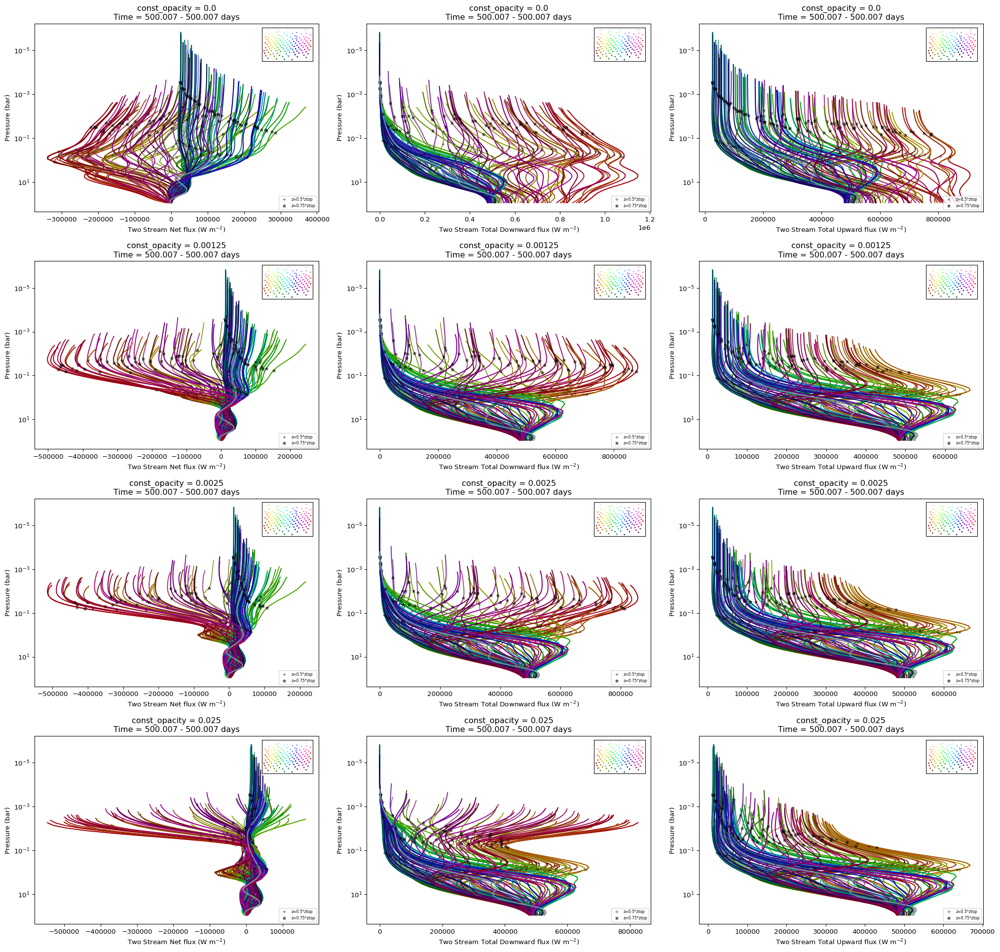

In [8]:

fig, ( (ax_k00_net, ax_k00_down, ax_k00_up),
       (ax_k000125_net, ax_k000125_down, ax_k000125_up ),
       (ax_k00025_net, ax_k00025_down, ax_k00025_up),
       (ax_k0025_net, ax_k0025_down, ax_k0025_up)
     ) = plt.subplots(4,3, figsize=(3*FIGSIZE_x, 4*FIGSIZE_y), dpi=dpi)


args_kappa.pview = ['TSfluxprof']
args_kappa.file = [str(exp_path_kappa_00)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00_net))
ttl = ax_k00_net.get_title()
ax_k00_net.set_title(f"const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125_net))
ttl = ax_k000125_net.get_title()
ax_k000125_net.set_title(f"const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025_net))
ttl = ax_k00025_net.get_title()
ax_k00025_net.set_title(f"const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_net))
ttl = ax_k0025_net.get_title()
ax_k0025_net.set_title(f"const_opacity = 0.025\n{ttl}")


# down
args_kappa.pview = ['TSfdtprof']
args_kappa.file = [str(exp_path_kappa_00)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00_down))
ttl = ax_k00_down.get_title()
ax_k00_down.set_title(f"const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125_down))
ttl = ax_k000125_down.get_title()
ax_k000125_down.set_title(f"const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025_down))
ttl = ax_k00025_down.get_title()
ax_k00025_down.set_title(f"const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_down))
ttl = ax_k0025_down.get_title()
ax_k0025_down.set_title(f"const_opacity = 0.025\n{ttl}")

# up
args_kappa.pview = ['TSfutprof']
args_kappa.file = [str(exp_path_kappa_00)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00_up))
ttl = ax_k00_up.get_title()
ax_k00_up.set_title(f"const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125_up))
ttl = ax_k000125_up.get_title()
ax_k000125_up.set_title(f"const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025_up))
ttl = ax_k00025_up.get_title()
ax_k00025_up.set_title(f"const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_up))
ttl = ax_k0025_up.get_title()
ax_k0025_up.set_title(f"const_opacity = 0.025\n{ttl}")

pass

# Comparison of THOMAS Single Walk, Short 

## Net Flux

In [9]:
file_idx = 2
args_kappa.initial_file = [file_idx]
args_kappa.last_file = [file_idx]
args_kappa.pgrid_ref = [f"pgrid_{file_idx}_{file_idx}_1.txt"]


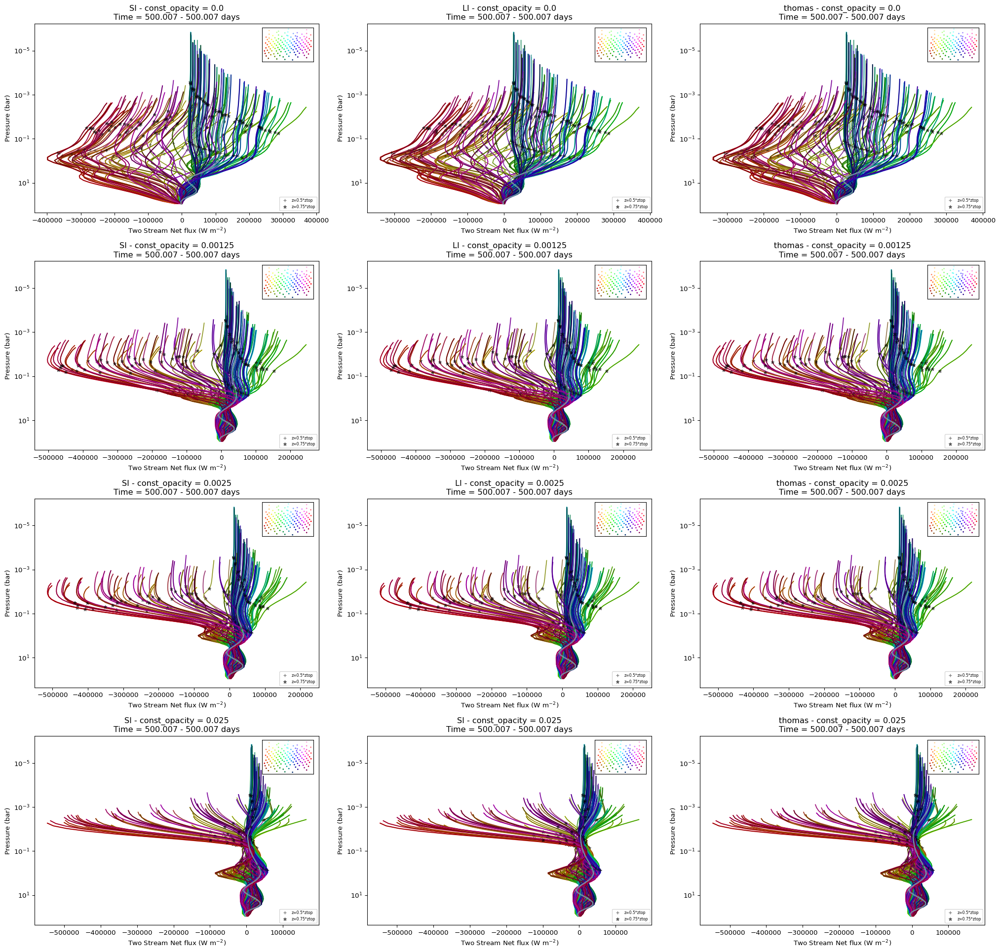

In [10]:
args_kappa.pview = ['TSfluxprof']
fig, ( (ax_k00_SI, ax_k00_LI, ax_k00),
       (ax_k000125_SI, ax_k000125_LI, ax_k000125 ),
       (ax_k00025_SI, ax_k00025_LI, ax_k00025),
       (ax_k0025_SI, ax_k0025_LI, ax_k0025)
     ) = plt.subplots(4,3, figsize=(3*FIGSIZE_x, 4*FIGSIZE_y), dpi=dpi)


# THOMAS
args_kappa.file = [str(exp_path_kappa_00)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00))
ttl = ax_k00.get_title()
ax_k00.set_title(f"thomas - const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125))
ttl = ax_k000125.get_title()
ax_k000125.set_title(f"thomas - const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025))
ttl = ax_k00025.get_title()
ax_k00025.set_title(f"thomas - const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025))
ttl = ax_k0025.get_title()
ax_k0025.set_title(f"thomas - const_opacity = 0.025\n{ttl}")


# SI
args_kappa.file = [str(exp_path_kappa_00_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00_LI))
ttl = ax_k00_LI.get_title()
ax_k00_LI.set_title(f"LI - const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125_LI))
ttl = ax_k000125_LI.get_title()
ax_k000125_LI.set_title(f"LI - const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025_LI))
ttl = ax_k00025_LI.get_title()
ax_k00025_LI.set_title(f"LI - const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_LI))
ttl = ax_k0025_LI.get_title()
ax_k0025_LI.set_title(f"SI - const_opacity = 0.025\n{ttl}")



# SI
args_kappa.file = [str(exp_path_kappa_00_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00_SI))
ttl = ax_k00_SI.get_title()
ax_k00_SI.set_title(f"SI - const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125_SI))
ttl = ax_k000125_SI.get_title()
ax_k000125_SI.set_title(f"SI - const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025_SI))
ttl = ax_k00025_SI.get_title()
ax_k00025_SI.set_title(f"SI - const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_SI))
ttl = ax_k0025_SI.get_title()
ax_k0025_SI.set_title(f"SI - const_opacity = 0.025\n{ttl}")




pass


## Downward flux



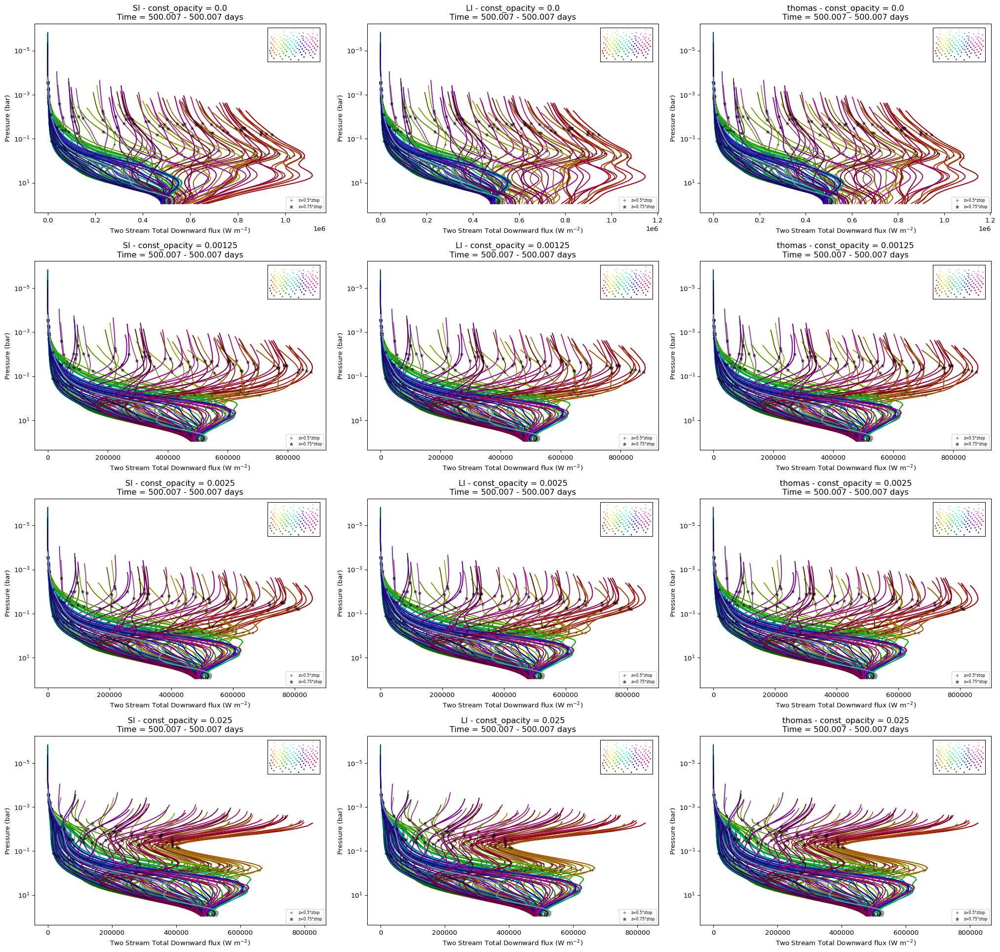

In [11]:
args_kappa.pview = ["TSfdtprof"]

fig, ( (ax_k00_SI, ax_k00_LI, ax_k00),
       (ax_k000125_SI, ax_k000125_LI, ax_k000125 ),
       (ax_k00025_SI, ax_k00025_LI, ax_k00025),
       (ax_k0025_SI, ax_k0025_LI, ax_k0025)
     ) = plt.subplots(4,3, figsize=(3*FIGSIZE_x, 4*FIGSIZE_y), dpi=dpi)

# THOMAS
args_kappa.file = [str(exp_path_kappa_00)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00))
ttl = ax_k00.get_title()
ax_k00.set_title(f"thomas - const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125))
ttl = ax_k000125.get_title()
ax_k000125.set_title(f"thomas - const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025))
ttl = ax_k00025.get_title()
ax_k00025.set_title(f"thomas - const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025))
ttl = ax_k0025.get_title()
ax_k0025.set_title(f"thomas - const_opacity = 0.025\n{ttl}")


# LI
args_kappa.file = [str(exp_path_kappa_00_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00_LI))
ttl = ax_k00_LI.get_title()
ax_k00_LI.set_title(f"LI - const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125_LI))
ttl = ax_k000125_LI.get_title()
ax_k000125_LI.set_title(f"LI - const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025_LI))
ttl = ax_k00025_LI.get_title()
ax_k00025_LI.set_title(f"LI - const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_LI))
ttl = ax_k0025_LI.get_title()
ax_k0025_LI.set_title(f"LI - const_opacity = 0.025\n{ttl}")



# SI
args_kappa.file = [str(exp_path_kappa_00_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00_SI))
ttl = ax_k00_SI.get_title()
ax_k00_SI.set_title(f"SI - const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125_SI))
ttl = ax_k000125_SI.get_title()
ax_k000125_SI.set_title(f"SI - const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025_SI))
ttl = ax_k00025_SI.get_title()
ax_k00025_SI.set_title(f"SI - const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_SI))
ttl = ax_k0025_SI.get_title()
ax_k0025_SI.set_title(f"SI - const_opacity = 0.025\n{ttl}")




pass

## Upward flux

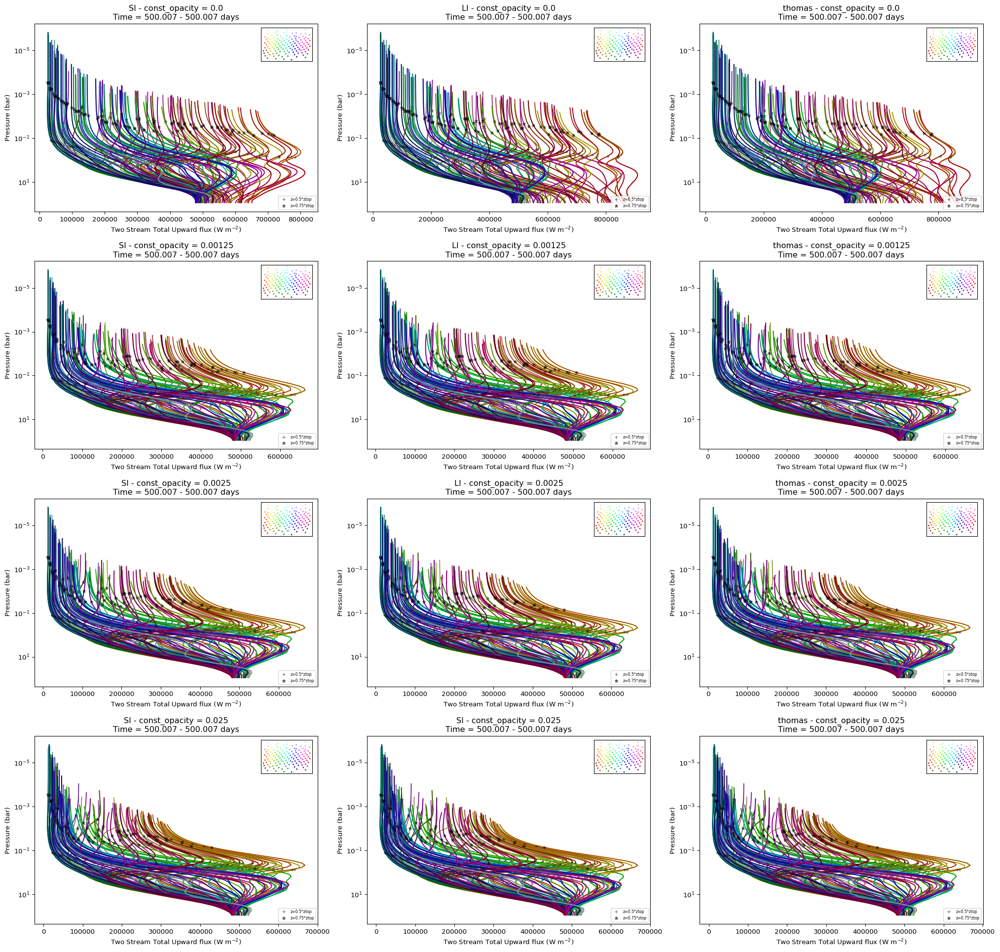

In [12]:
args_kappa.pview = ["TSfutprof"]

fig, ( (ax_k00_SI, ax_k00_LI, ax_k00),
       (ax_k000125_SI, ax_k000125_LI, ax_k000125 ),
       (ax_k00025_SI, ax_k00025_LI, ax_k00025),
       (ax_k0025_SI, ax_k0025_LI, ax_k0025)
     ) = plt.subplots(4,3, figsize=(3*FIGSIZE_x, 4*FIGSIZE_y), dpi=dpi)

# THOMAS
args_kappa.file = [str(exp_path_kappa_00)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00))
ttl = ax_k00.get_title()
ax_k00.set_title(f"thomas - const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125))
ttl = ax_k000125.get_title()
ax_k000125.set_title(f"thomas - const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025))
ttl = ax_k00025.get_title()
ax_k00025.set_title(f"thomas - const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025))
ttl = ax_k0025.get_title()
ax_k0025.set_title(f"thomas - const_opacity = 0.025\n{ttl}")


# LI
args_kappa.file = [str(exp_path_kappa_00_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00_LI))
ttl = ax_k00_LI.get_title()
ax_k00_LI.set_title(f"LI - const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125_LI))
ttl = ax_k000125_LI.get_title()
ax_k000125_LI.set_title(f"LI - const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025_LI))
ttl = ax_k00025_LI.get_title()
ax_k00025_LI.set_title(f"LI - const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025_LI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_LI))
ttl = ax_k0025_LI.get_title()
ax_k0025_LI.set_title(f"SI - const_opacity = 0.025\n{ttl}")



# SI
args_kappa.file = [str(exp_path_kappa_00_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00_SI))
ttl = ax_k00_SI.get_title()
ax_k00_SI.set_title(f"SI - const_opacity = 0.0\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00125_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k000125_SI))
ttl = ax_k000125_SI.get_title()
ax_k000125_SI.set_title(f"SI - const_opacity = 0.00125\n{ttl}")

args_kappa.file = [str(exp_path_kappa_00025_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k00025_SI))
ttl = ax_k00025_SI.get_title()
ax_k00025_SI.set_title(f"SI - const_opacity = 0.0025\n{ttl}")

args_kappa.file = [str(exp_path_kappa_0025_SI)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_SI))
ttl = ax_k0025_SI.get_title()
ax_k0025_SI.set_title(f"SI - const_opacity = 0.025\n{ttl}")




pass

# THOMAS with longer integration for kappa = 0.025

This is still in spinup phase, so most of flux influence will be DG anyway, not so interesting before running it longer

In [13]:
file_idx = 433
args_kappa.initial_file = [file_idx]
args_kappa.last_file = [file_idx]
args_kappa.pgrid_ref = [f"pgrid_{file_idx}_{file_idx}_1.txt"]


Text(0.5, 1.0, 'const_opacity = 0.025\nTime = 501.503 - 501.503 days')

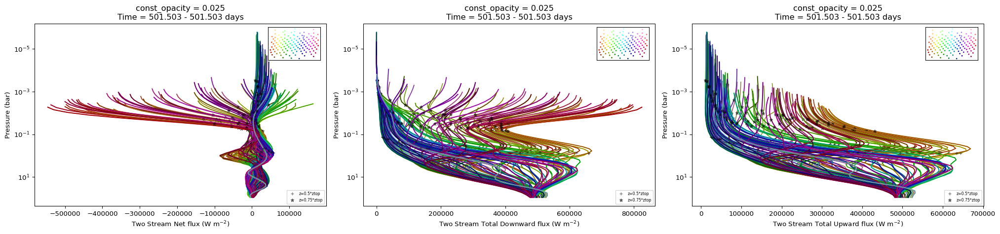

In [14]:

fig, (ax_k0025_net, ax_k0025_down, ax_k0025_up) = plt.subplots(1,3, figsize=(3*FIGSIZE_x, 1*FIGSIZE_y), dpi=dpi)


args_kappa.pview = ['TSfluxprof']

args_kappa.file = [str(exp_path_kappa_0025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_net))
ttl = ax_k0025_net.get_title()
ax_k0025_net.set_title(f"const_opacity = 0.025\n{ttl}")


# down
args_kappa.pview = ['TSfdtprof']
args_kappa.file = [str(exp_path_kappa_0025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_down))
ttl = ax_k0025_down.get_title()
ax_k0025_down.set_title(f"const_opacity = 0.025\n{ttl}")

# up
args_kappa.pview = ['TSfutprof']
args_kappa.file = [str(exp_path_kappa_0025)]
mph.make_plot(args_kappa, False, axis=(fig, ax_k0025_up))
ttl = ax_k0025_up.get_title()
ax_k0025_up.set_title(f"const_opacity = 0.025\n{ttl}")